In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.animation as anim
from scipy import stats
import os 


	

## Importar datos

In [3]:
files = os.listdir('positions1')
files = [file for file in files if file.endswith('.bin')]

with open('config1.txt','r') as f:
	lines = [float(line) for line in f.readlines()]



print(lines)
t_max_a = lines[0]
dt=lines[1]
V0=lines[2]
T=lines[3]


[10000.0, 0.01, 10.0, 4.0]


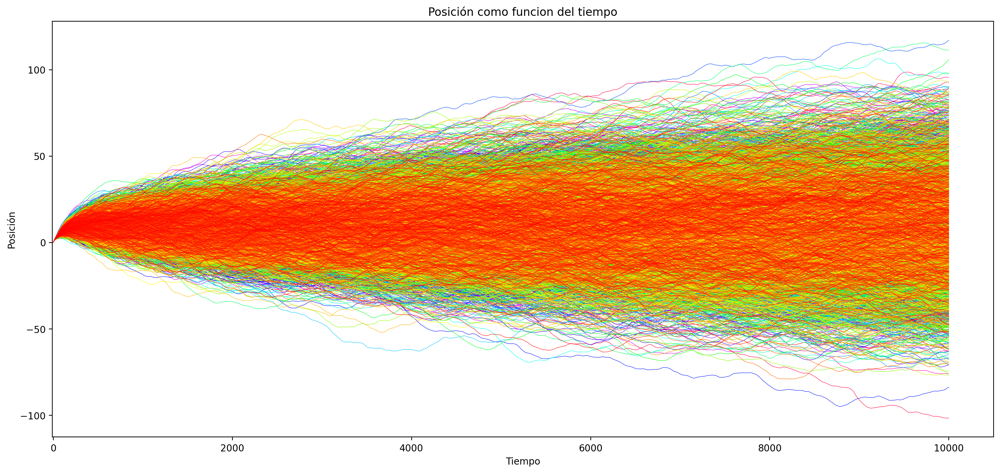

In [4]:
particle_postions_a = []
ii=0
N=len(files)
plt.figure(figsize=(18,8),dpi=200)
for file in files:

	if not file.endswith('.bin'):
		continue
	ii+=1
	x=np.fromfile('positions1/'+file,dtype=np.float64)
	particle_postions_a.append(x)
	hsv=((N-ii)/N,1,1)

	rgb=mcolors.hsv_to_rgb(hsv)
	plt.plot(x,linewidth=0.4,color=rgb)
plt.xlim(xmin=-10)
plt.title("Posición como funcion del tiempo")
plt.xlabel("Tiempo")
plt.ylabel("Posición")
plt.show()

## Varianza

(5000, 10000)
(10000,)
0.010104303600277737
slope = 0.0808344288022219
intercept = -16.27505565315414
r_value = 0.9998754231987362
p_value = 0.0
std_err = 1.2761859921427162e-05


Text(0, 0.5, 'Varianza')

<Figure size 640x480 with 0 Axes>

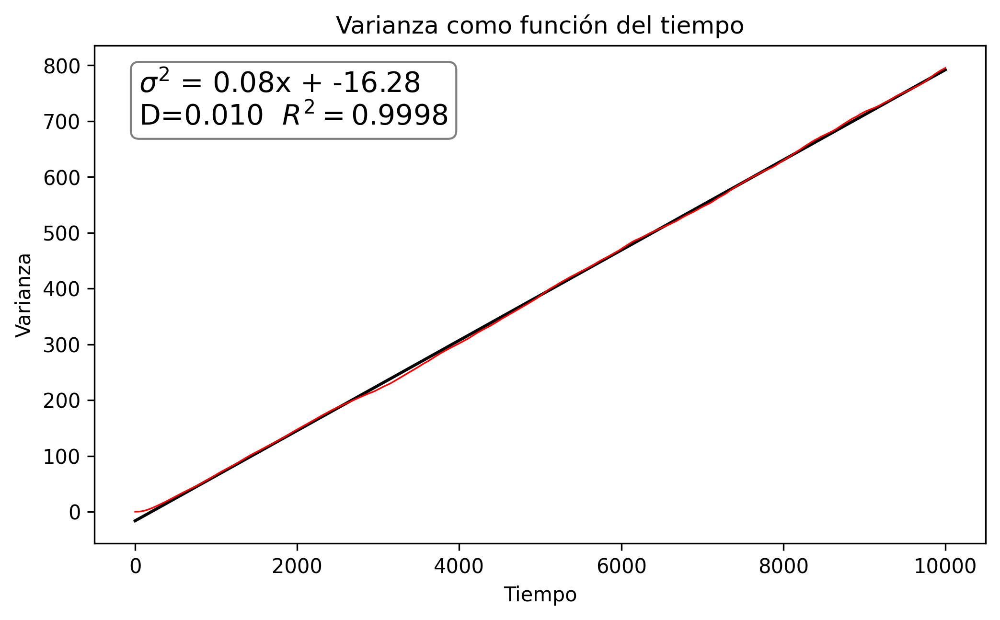

In [5]:
particle_positions_2d_a = np.stack(particle_postions_a)
print(particle_positions_2d_a.shape)
variance_at_each_time_a = np.var(particle_positions_2d_a, axis=0)
print(variance_at_each_time_a.shape)

time_points_a = np.arange(len(variance_at_each_time_a))
coeffs = np.polyfit(time_points_a, variance_at_each_time_a, 1)
fitted_data = coeffs[0] * time_points_a + coeffs[1]

plt.figure(dpi=100)


slope, intercept, r_value, p_value, std_err = stats.linregress(time_points_a, variance_at_each_time_a)

# slope=2DT
D_a=slope/(2*T)
print(D_a)

print('slope =', slope)
print('intercept =', intercept)
print('r_value =', r_value)
print('p_value =', p_value)
print('std_err =', std_err)
scale=0.5
plt.figure(dpi=300,figsize=(16*scale,9*scale))
plt.text(0.05, 0.95, f'$\sigma^2$ = {coeffs[0]:.2f}x + {coeffs[1]:.2f}\nD={D_a:.3f}  $R^2=${r_value*r_value:.4f}', transform=plt.gca().transAxes, 
         fontsize=14, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

plt.plot(fitted_data, label='Fitted line',color='black')
plt.plot(time_points_a,variance_at_each_time_a,linewidth=0.8,color='red')
plt.title("Varianza como función del tiempo")
plt.xlabel("Tiempo")
plt.ylabel("Varianza")



## Animacion

C:\Users\Usuario\AppData\Local\Temp\ipykernel_13972\678397968.py:37: RuntimeWarning: invalid value encountered in sqrt
  sigma_fitted=np.sqrt(slope*time+intercept)


nan 0.0014206402730355136
nan 0.0014206402730355136
15.910565531892683 15.669951733501225
22.85972980466867 22.79935173168031


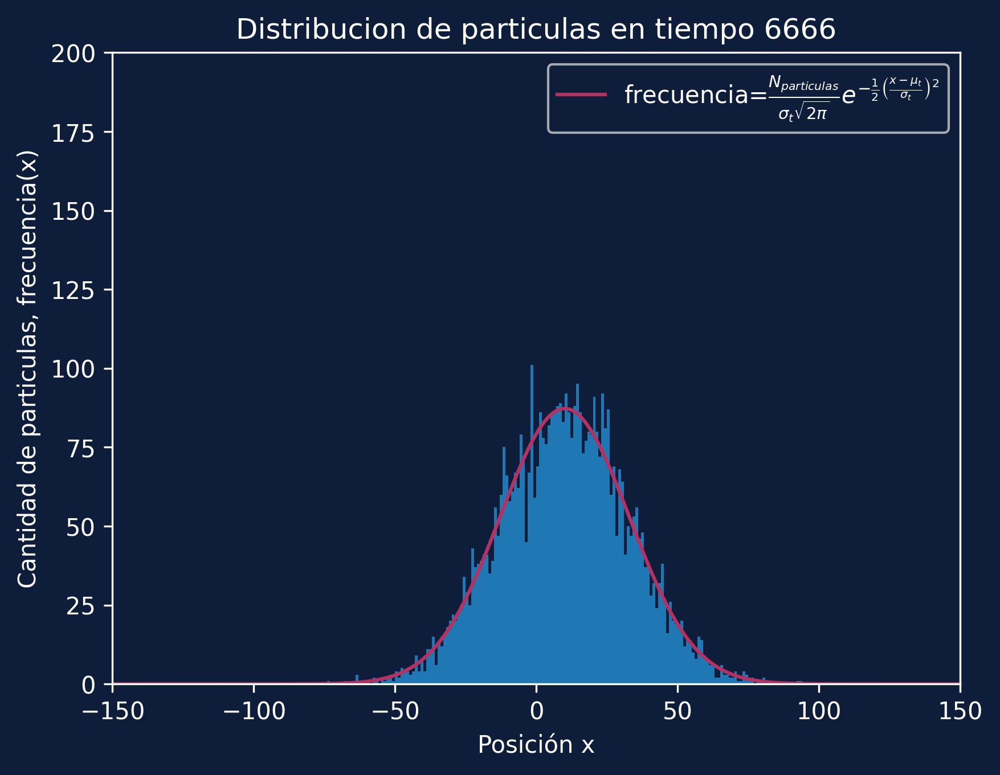

In [22]:
last_postion=particle_positions_2d_a[:, -1]
plt.rcParams['text.color'] = 'w'
plt.rcParams['axes.labelcolor'] = 'w'

fig, ax = plt.subplots()
fig.set_dpi(300)
bin_size = 1
bins_ = np.arange(-150, 150, bin_size)
fig.patch.set_facecolor((14/255,29/255,57/255,255/255))
# t_max=frames*interval
frames=3
interval=int(t_max_a/frames)

def gaussian(mu,sigma,x):
	if sigma<=0:
		return np.zeros(len(x))
	return np.exp(
		-0.5*(((x-mu)/sigma)**2)
			   )*(1/(sigma*np.sqrt(2*np.pi)))*5000



def update(i):
	time=i*interval
	ax.clear()
	ax.set_facecolor((14/255,29/255,57/255,255/255))
	ax.set_ylabel('Cantidad de particulas, frecuencia(x)')
	ax.set_xlabel('Posición x')
	ax.set_xlim(-150, 150)
	ax.set_ylim(0, 200)
	ax.hist(particle_positions_2d_a[:, i*interval], bins=bins_, color=(178/255,51/255,99/255,255/255))
	for spine in ax.spines.values():
		spine.set_edgecolor('w')

	# Change color of ticks
	ax.tick_params(colors='w')
	sigma_fitted=np.sqrt(slope*time+intercept)
	print(sigma_fitted,np.sqrt(variance_at_each_time_a[time]))
	ax.plot(bins_, 
		gaussian(
			np.average(particle_positions_2d_a[:, time]),
			sigma_fitted,
			bins_
			)
		,label=r"frecuencia=$ \frac{N_{particulas}}{\sigma_t \sqrt{2 \pi}}e^{-\frac{1}{2}\left(\frac{x-\mu_t}{\sigma_t} \right)^2  }$"
		)
	
	ax.set_title(f'Distribucion de particulas en tiempo {time}')
	legend=ax.legend()
	legend.get_frame().set_facecolor((14/255,29/255,57/255,255/255))


animation = anim.FuncAnimation(fig, update, frames=frames, interval=interval)
animation.save("hist4.mov", fps=30)
plt.show()



# Punto B

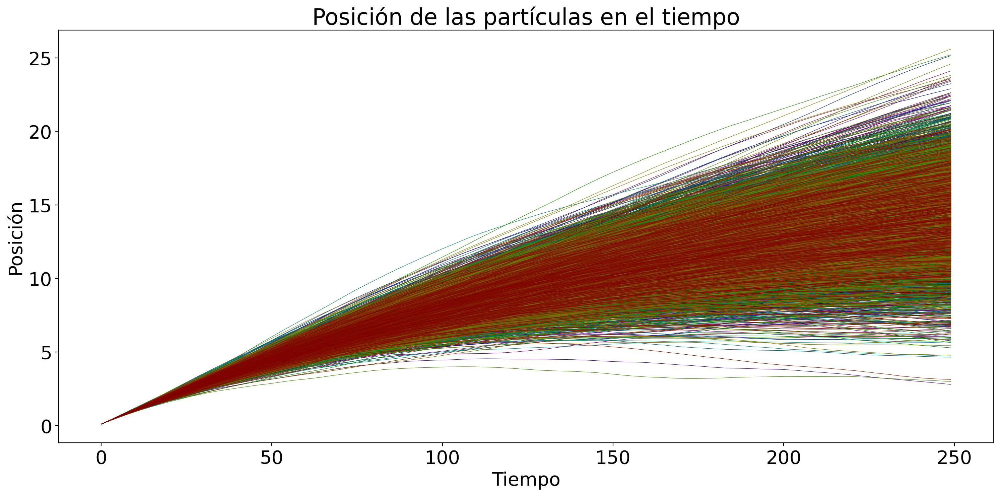

(-1.0, 263.0)

<Figure size 640x480 with 0 Axes>

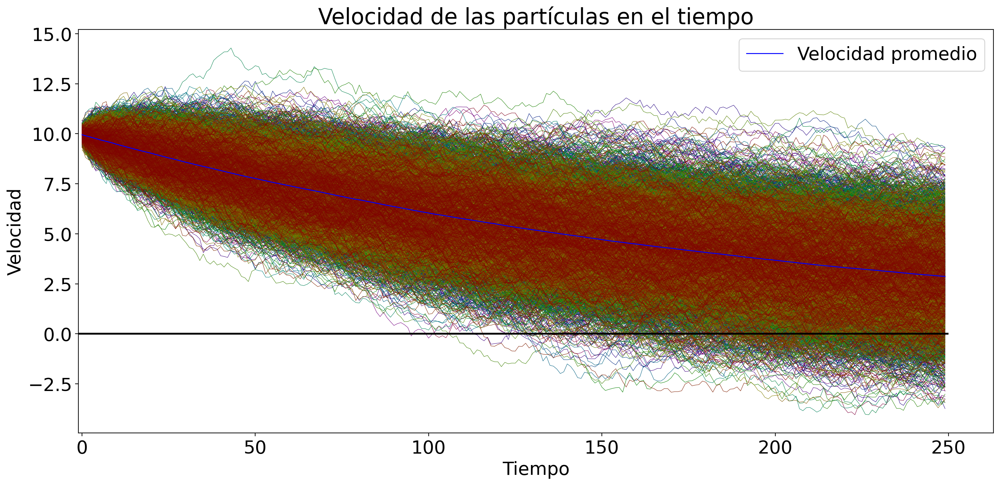

In [ ]:
files_b = os.listdir('positions2')
files_b = [file_b for file_b in files_b if file.endswith('.bin')]


with open('config2.txt','r') as f:
	lines_b = [float(line_b) for line_b in f.readlines()]

dt_b=lines_b[1]
Temp_b=lines_b[3]
gamma_value_b=lines_b[4]
particle_positions_b = []
ii=0
N=len(files_b)
plt.rcParams['font.size'] = 20
plt.figure(figsize=(18,8),dpi=200)
for file_b in files_b:
	# check the file ends with .bin
	if not file_b.endswith('.bin'):
		continue
	ii+=1
	x=np.fromfile('positions2/'+file_b,dtype=np.float64)
	particle_positions_b.append(x)
	hsv=((N-ii)/N,1,0.5)

	rgb=mcolors.hsv_to_rgb(hsv)
	plt.plot(x,linewidth=0.4,color=rgb)
plt.title("Posición de las partículas en el tiempo")
plt.ylabel("Posición")
plt.xlabel("Tiempo")
plt.show()
plt.clf()	

files_bv = os.listdir('velocities2')
files_bv = [file_bv for file_bv in files_bv if file_bv.endswith('.bin')]


particle_velocities_bv = []
ii=0
N=len(files)
plt.figure(figsize=(18,8),dpi=200)
for file_bv in files_bv:
	# check the file ends with .bin
	if not file_bv.endswith('.bin'):
		continue
	ii+=1
	x=np.fromfile('velocities2/'+file_bv,dtype=np.float64)
	particle_velocities_bv.append(x)
	hsv=((N-ii)/N,1,0.5)

	rgb=mcolors.hsv_to_rgb(hsv)
	plt.plot(x,linewidth=0.4,color=rgb)
	
particle_velocities_b_2d = np.stack(particle_velocities_bv)
velocities_b_avgerge=np.mean(particle_velocities_b_2d,axis=0)
plt.plot(velocities_b_avgerge,color='blue',linewidth=1,label='Velocidad promedio')
plt.legend()
plt.hlines(0,-10,250,colors='black',linewidth=2)
plt.title("Velocidad de las partículas en el tiempo")
plt.ylabel("Velocidad")
plt.xlabel("Tiempo")
plt.xlim(xmin=-1)


C:\Users\Usuario\AppData\Local\Temp\ipykernel_6608\759938.py:4: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * x)


0.004992497565365482


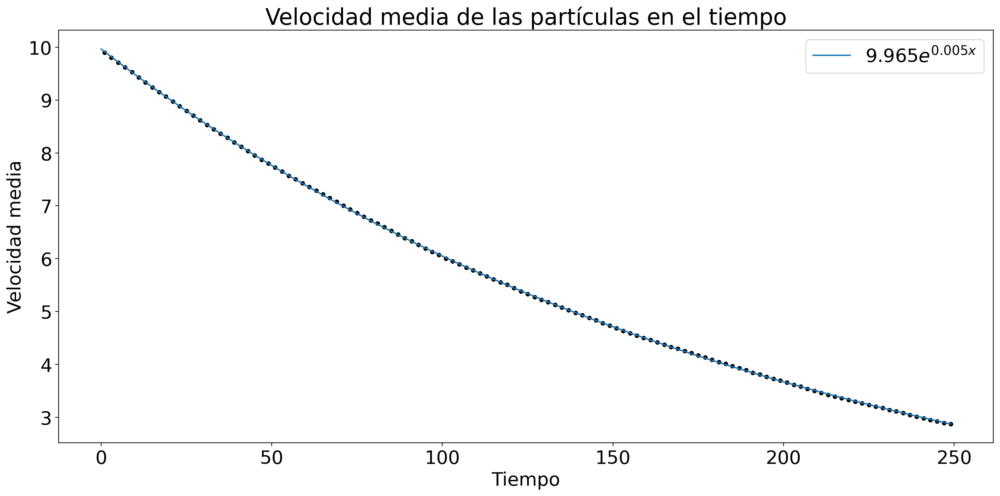

In [ ]:
from scipy.optimize import curve_fit

def func(x, a, b):
    return a * np.exp(-b * x) 

plt.figure(figsize=(18,8),dpi=200)
time=np.arange(0,len(velocities_b_avgerge))
popt, pcov = curve_fit(func, time, velocities_b_avgerge)
plt.plot(time, func(time, *popt),label=f'${popt[0]:.3f}e^{{{popt[1]:.3f}x}}$')
plt.scatter(time[1::2], velocities_b_avgerge[1::2],color='black',s=15) 
plt.title("Velocidad media de las partículas en el tiempo")

plt.legend()
plt.xlabel("Tiempo")
plt.ylabel("Velocidad media")
print(popt[1])

(250,)


Text(0.5, 0, 'Tiempo')

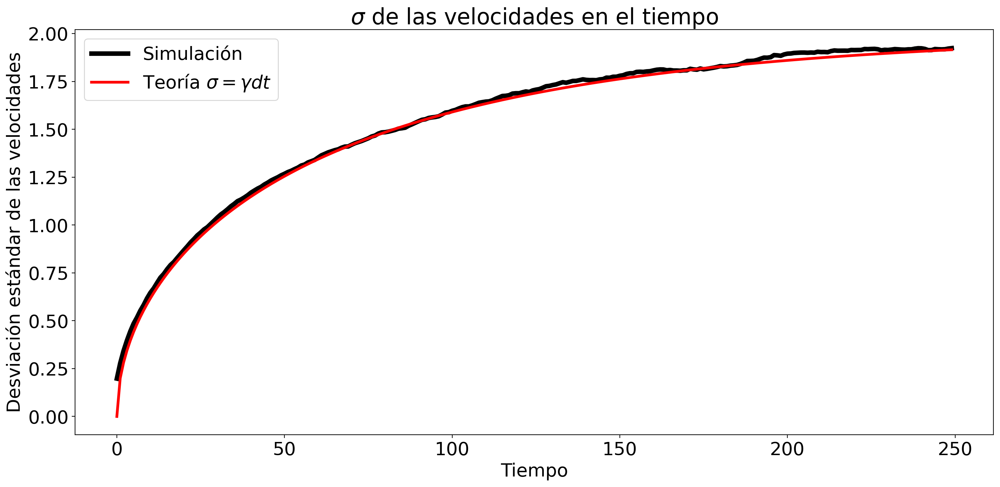

In [ ]:
variance_velocities = np.var(particle_velocities_b_2d, axis=0)
time=np.arange(0,len(variance_velocities))
print(variance_velocities.shape)
Kb=1
M=1
KbT=Kb*Temp_b
KbT_M=KbT/M
sigma_value=gamma_value_b*dt_b
def sigma_theory(t):
	return np.sqrt(KbT_M*(1-np.exp(-2*sigma_value*t)))

plt.figure(figsize=(18,8),dpi=200)
plt.title("$\sigma$ de las velocidades en el tiempo")
plt.plot(np.sqrt(variance_velocities),color='black',linewidth=5,label='Simulación')
plt.plot(time,sigma_theory(time),color='red',linewidth=3,label='Teoría $\sigma=\gamma dt$')
plt.legend()
plt.ylabel("Desviación estándar de las velocidades")
plt.xlabel("Tiempo")